In [1]:


import pyproj
import geopandas as gpd # version 1.0.1
import stackstac
import numpy as np
import pystac_client
from rasterio.enums import Resampling
import json
from ipyleaflet import Map, GeoJSON
import shapely

from shapely.geometry import shape
from shapely.ops import transform
from stacchip.indexer import NoStatsChipIndexer
from stacchip.chipper import Chipper
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt

In [8]:
STAC_API = "https://earth-search.aws.element84.com/v1"
COLLECTION = "sentinel-2-l2a"

with open("california.geojson", "r")  as f: 
    CALIFORNIA_AOI = json.loads(f.read())

with open("California_County_Boundaries.geojson", "r") as f:
    counties = json.loads(f.read())

    [sonoma] = [f for f in counties["features"] if f["properties"]["CountyName"] == "Sonoma"]
    CALIFORNIA_AOI = sonoma

# Search the catalogue
catalog = pystac_client.Client.open(STAC_API)
search = catalog.search(
    collections=[COLLECTION],
    datetime=f"2020-01-01/2020-06-01",
    intersects=CALIFORNIA_AOI,
    max_items = None,
    query={"eo:cloud_cover": {"lt": 20}},
)

before_items = search.item_collection()

search = catalog.search(
    collections=[COLLECTION],
    datetime=f"2021-01-01/2021-06-01",
    intersects=CALIFORNIA_AOI,
    max_items = None,
    query={"eo:cloud_cover": {"lt": 20}},
)

after_items = search.item_collection()
print(f"Found {len(before_items)} items before and {len(after_items)} items after")


Found 186 items before and 217 items after


In [9]:
def get_covering_chips(stac_items, aoi, threshold=0.9999):
    
    cumulative_coverage = None
    selected_chips = []
    aoi_shape = shape(aoi["geometry"])
    aoi_area = aoi_shape.area

    pbar = tqdm(total=aoi_area)
    try: 
        for item in stac_items:
            indexer = NoStatsChipIndexer(item, chip_size=256, chip_max_nodata=0.9)
            chipper = Chipper(indexer, assets=["blue", "green", "red", "nir"])
    
            for i,j in [(i,j) for i in range(indexer.x_size) for j in range(indexer.y_size)]:
                geom = shape(indexer.get_chip_bbox(x=i, y=j))

                if cumulative_coverage is None : 
                    cumulative_coverage = geom
                    selected_chips= [{"chip": chipper.chip(x=i, y=j), "geometry": geom, "index":(i,j)}]
                    break
                
                joined = cumulative_coverage.union(geom)
                prev_intersection_area = aoi_shape.intersection(cumulative_coverage).area
                new_intersection_area = aoi_shape.intersection(joined).area

                if new_intersection_area > prev_intersection_area:
                    selected_chips.append({"chip": chipper.chip(x=i, y=j), "geometry": geom, "index": (i,j)})
                    cumulative_coverage = joined

                    pbar.update( new_intersection_area - prev_intersection_area)
                
                    if new_intersection_area/aoi_area > threshold:
                        raise Exception(f"Full coverage ({round(100*new_intersection_area/aoi_area, 4)}%) reached with {len(selected_chips)} chips")
                    
                       
                
    except Exception as e:
        print(e)

    pbar.close()
    return selected_chips

before_chips = get_covering_chips(before_items, CALIFORNIA_AOI, threshold=0.999)

  0%|          | 0/0.42477648557313835 [00:00<?, ?it/s]

Full coverage (99.9587%) reached with 32 chips


In [10]:
geometries_to_match = [chip["geometry"] for chip in before_chips]
after_chips = []
for item in tqdm(after_items): 
    
    indexer = NoStatsChipIndexer(item, chip_size=256, chip_max_nodata=0.9)
    chipper = Chipper(indexer, assets=["blue", "green", "red", "nir"])
    
    for i,j in tqdm([(i,j) for i in range(indexer.x_size) for j in range(indexer.y_size)], leave=False):

        chip_geometry = shape(indexer.get_chip_bbox(x=i, y=j))
        
        matched_geometry = [i for i,g in enumerate(geometries_to_match) if g == chip_geometry]
        if len(matched_geometry) == 0: 
            continue
        geometries_to_match.pop(matched_geometry[0])    
        after_chips.append({"chip": chipper.chip(x=i, y=j), "geometry": chip_geometry, "index": (i,j)})
        

    if len(geometries_to_match) == 0: 
        break        


assert len(before_chips) == len(after_chips)
print(f"Num chips: {len(before_chips)}")


  0%|          | 0/217 [00:00<?, ?it/s]

  0%|          | 0/1764 [00:00<?, ?it/s]

  0%|          | 0/1764 [00:00<?, ?it/s]

  0%|          | 0/1764 [00:00<?, ?it/s]

  0%|          | 0/1764 [00:00<?, ?it/s]

  0%|          | 0/1764 [00:00<?, ?it/s]

  0%|          | 0/1764 [00:00<?, ?it/s]

  0%|          | 0/1764 [00:00<?, ?it/s]

  0%|          | 0/1764 [00:00<?, ?it/s]

  0%|          | 0/1764 [00:00<?, ?it/s]

  0%|          | 0/1764 [00:00<?, ?it/s]

  0%|          | 0/1764 [00:00<?, ?it/s]

Num chips: 32


In [5]:
gdf = gpd.read_file("California_Fire_Perimeters_7897608464518632307.geojson")
gdf = gdf.to_crs(epsg=4326)
glass_fire = json.loads(gdf[gdf["FIRE_NAME"] == "GLASS"].to_json())
glass_fire

{'type': 'FeatureCollection',
 'features': [{'id': '220',
   'type': 'Feature',
   'properties': {'OBJECTID': 21667,
    'YEAR_': '2020',
    'STATE': 'CA',
    'AGENCY': 'CDF',
    'UNIT_ID': 'LNU',
    'FIRE_NAME': 'GLASS',
    'INC_NUM': '00015497',
    'ALARM_DATE': 'Sun, 27 Sep 2020 00:00:00 GMT',
    'CONT_DATE': 'Tue, 20 Oct 2020 00:00:00 GMT',
    'CAUSE': 14.0,
    'C_METHOD': 7.0,
    'OBJECTIVE': 1.0,
    'GIS_ACRES': 67484.41,
    'COMMENTS': 'J. Baldwin',
    'COMPLEX_NAME': None,
    'COMPLEX_INCNUM': None,
    'IRWINID': None,
    'FIRE_NUM': None,
    'DECADES': '2020'},
   'geometry': {'type': 'MultiPolygon',
    'coordinates': [[[[-122.56490371068445, 38.43167005304666],
       [-122.56482631273789, 38.43153835705897],
       [-122.56502929965275, 38.43143880714889],
       [-122.56525753821023, 38.43136729244443],
       [-122.56538476750225, 38.43118363189909],
       [-122.56541131631215, 38.430897343645675],
       [-122.56537489861054, 38.43054572219989],
       

In [11]:

# Create a map
m = Map(center=(37.7749, -122.4194), zoom=6, scroll_wheel_zoom=True)


sonoma_geoson = GeoJSON(data=CALIFORNIA_AOI, name="Sonoma County", style={"color": "black", "fillOpacity": 0.0})
m.add_layer(sonoma_geoson)

# Create a GeoJSON layer for the before items geometries
before_geojson = GeoJSON(
    data={"type": "FeatureCollection", "features": [{"type": "Feature", "geometry": json.loads(shapely.to_geojson(f["geometry"]))} for f in before_chips]}, 
    style={"color": "blue","fillOpacity": 0.0}, 
    hover_style={"fillColor": "blue", "fillOpacity": 0.2},
    name="Before Items"
)

#Add the GeoJSON layer to the map
m.add_layer(before_geojson)

glass_fire_geoson = GeoJSON(data=glass_fire, name="Glass Fire", style={"color": "red", "fillOpacity": 0.2})
m.add_layer(glass_fire_geoson)

# Display the map
m

Map(center=[37.7749, -122.4194], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', '…

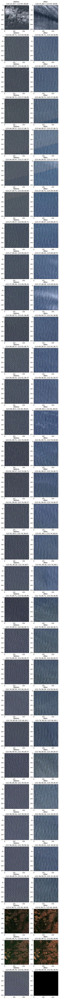

In [22]:
fix, axs = plt.subplots(32, 2, figsize=(7, 130))  # Create 2 subplots for side-by-side display
count = 0

def rescale(arr):
    if arr.max() == arr.min():
        return arr
    return (arr - arr.min()) / (arr.max() - arr.min())

fire_chips = [c for c in before_chips if any([shape(c["geometry"]).intersects(shape(f["geometry"])) for f in glass_fire["features"]])]


#for chip in fire_chips: 
for chip in before_chips:
    bounds = shape(chip["geometry"]).bounds
    
    [minx, miny, maxx, maxy] = [round(bounds[i], 2) for i in range(4)]

    # Process and display the 'before' chip
    arr = rescale(np.array([chip["chip"][c][0] for c in ["red", "green", "blue"]]))

    axs[count, 0].imshow(arr.swapaxes(0,2))
    axs[count, 0].set_title(f"Before: \n {minx},{miny},{maxx},{maxy}")

    # Process and display the 'after' chip (same index)
    [after_chip] = [c for c in after_chips if c["geometry"] == chip["geometry"]]
    arr = rescale(np.array([after_chip["chip"][c][0] for c in ["red", "green", "blue"]]))
    axs[count, 1].imshow(arr.swapaxes(0,2))
    
    axs[count, 1].set_title(f"After: \n {minx},{miny},{maxx},{maxy}")

    count += 1
        
plt.show()  # Show the side-by-side comparison for this chip pair

In [ ]:
stack = stackstac.stack(
    simplified_before_items[0:10], 
    resampling=Resampling.nearest, 
    snap_bounds=False, 
    resolution=10, 
    rescale=False, 
    dtype="float32",
    assets=["blue", "green", "red", "nir"]
)

#stack.compute()

Exception ignored in: <function AutoParallelRioReader.__del__ at 0x12e562de0>
Traceback (most recent call last):
  File "/Users/leo/development-seed/clay-foundation/model/.venv/lib/python3.11/site-packages/stackstac/rio_reader.py", line 438, in __del__
    def __del__(self) -> None:

KeyboardInterrupt: 


In [ ]:
stack

<xarray.DataArray 'stackstac-28e78dd4e7cdf572f664f4b96e044b09' (time: 10,
                                                                band: 4,
                                                                y: 30978,
                                                                x: 20982)> Size: 208GB
dask.array<fetch_raster_window, shape=(10, 4, 30978, 20982), dtype=float64, chunksize=(1, 1, 1024, 1024), chunktype=numpy.ndarray>
Coordinates: (12/52)
  * time                                     (time) datetime64[ns] 80B 2020-0...
    id                                       (time) <U24 960B 'S2B_10TEL_2020...
  * band                                     (band) <U5 80B 'blue' ... 'nir'
  * x                                        (x) float64 168kB 5e+05 ... 7.09...
  * y                                        (y) float64 248kB 4.6e+06 ... 4....
    s2:reflectance_conversion_factor         (time) float64 80B 0.9771 ... 0....
    ...                                       ...
    proj:shape                               object 8B {10980}
    title                                    (band) <U20 320B 'Blue (band 2) ...
    common_name                              (band) <U5 80B 'blue' ... 'nir'
    center_wavelength                        (band) float64 32B 0.49 ... 0.842
    full_width_half_max                      (band) float64 32B 0.098 ... 0.145
    epsg                                     int64 8B 32610
Attributes:
    spec:        RasterSpec(epsg=32610, bounds=(499980.0, 4290240.0, 709800.0...
    crs:         epsg:32610
    transform:   | 10.00, 0.00, 499980.00|\n| 0.00,-10.00, 4600020.00|\n| 0.0...
    resolution:  10

In [ ]:
before_stack = stackstac.stack(
    before_items, 
    snap_bounds=False, 
    resolution=10, 
    rescale=False, 
    assets=["blue", "green", "red", "nir"],
    resampling=Resampling.nearest
)

before_stack = before_stack.compute()

after_stack = stackstac.stack(
    after_items, 
    snap_bounds=False, 
    resolution=10, 
    rescale=False, 
    assets=["blue", "green", "red", "nir"],
    resampling=Resampling.nearest
)

after_stack = after_stack.compute()

In [ ]:
before_stack[0]
#before_stack[0].sel(band=["red", "green", "blue"]).plot.imshow(
#    row="time", rgb="band", vmin=0, vmax=2000, col_wrap=6
#)

<xarray.DataArray 'stackstac-44fe634424e30738ac7cdcfa479e768d' (band: 4, y: 1,
                                                                x: 1)> Size: 32B
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates: (12/53)
    time                                     datetime64[ns] 8B 2020-01-01T18:...
    id                                       <U24 96B 'S2B_11TQG_20200101_0_L2A'
  * band                                     (band) <U5 80B 'blue' ... 'nir'
  * x                                        (x) float64 8B -123.0
  * y                                        (y) float64 8B 42.45
    s2:reflectance_conversion_factor         float64 8B 1.034
    ...                                       ...
    proj:shape                               object 8B {10980}
    title                                    (band) <U20 320B 'Blue (band 2) ...
    common_name                              (band) <U5 80B 'blue' ... 'nir'
    center_wavelength                        (band) float64 32B 0.49 ... 0.842
    full_width_half_max                      (band) float64 32B 0.098 ... 0.145
    epsg                                     int64 8B 4326
Attributes:
    spec:        RasterSpec(epsg=4326, bounds=(-123.00021744693974, 31.541537...
    crs:         epsg:4326
    transform:   | 10.00, 0.00,-123.00|\n| 0.00,-10.00, 42.45|\n| 0.00, 0.00,...
    resolution:  10